# Interpretable DNN model for kinase family inhibitors prediction

This code is to build deep neural networks to predict kinase family inhibitors and interpret the model to understand the characteristics of kinase family inhibitors. This is very important for the drug design of the kinase.

In [1]:
########### import package ###########
import numpy as np
from keras.utils import np_utils
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from keras.layers import Dense, Activation, Dropout
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers
from keras import regularizers
import tensorflow as tf
import os

Using TensorFlow backend.
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\bboyf\Anaconda3\envs

## Setting GPU
The GUP of NVIDIA is used here.

In [2]:
# Number of GPU 
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Auto
#gpu_options = tf.GPUOptions(allow_growth=True)
 
# Set what proportion of GPU to use
gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.5)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

tf.keras.backend.set_session(sess)

## Build DNN model and hyperparameters setting

---------------------- Data information ----------------------
EGFR_data:
                            0    1    2    3    4    5    6    7    8    9    \
0  AAGKMGNYUYCEPD-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
1  AAWZYZGJDOSLSU-NSHDSACASA-N    1    0    0    0    0    0    0    0    0   
2  AAYJEKJTXVXYTO-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
3  AAYZTFLAQXDFOL-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
4  ABXIBRWZRWHJCZ-KBPBESRZSA-N    1    0    0    0    0    0    0    0    0   
5  ABXIBRWZRWHJCZ-UONOGXRCSA-N    1    0    0    0    0    0    0    0    0   
6  ACEREWSFULKZGV-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
7  ACGUYXCXAPNIKK-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
8  ACNCCUVYXQGPKZ-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
9  ACNYXAIBELJFSP-JLHYYAGUSA-N    1    0    0    0    0    0    0    0    0   

   ...  230  231  232  233  234  235  236  237  238  23

C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '



Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 2s - loss: 8.5536 - accuracy: 0.8733 - val_loss: 5.9231 - val_accuracy: 0.7409
Epoch 2/100
 - 0s - loss: 3.6819 - accuracy: 0.9325 - val_loss: 2.6071 - val_accuracy: 0.8870
Epoch 3/100
 - 0s - loss: 1.4675 - accuracy: 0.9358 - val_loss: 1.4124 - val_accuracy: 0.8837
Epoch 4/100
 - 0s - loss: 0.7103 - accuracy: 0.9433 - val_loss: 1.0018 - val_accuracy: 0.8605
Epoch 5/100
 - 0s - loss: 0.4574 - accuracy: 0.9450 - val_loss: 0.8531 - val_accuracy: 0.7043
Epoch 6/100
 - 0s - loss: 0.3213 - accuracy: 0.9542 - val_loss: 0.7464 - val_accuracy: 0.8007
Epoch 7/100
 - 0s - loss: 0.3055 - accuracy: 0.9442 - val_loss: 0.7490 - val_accuracy: 0.6412
Epoch 8/100
 - 0s - loss: 0.2927 - accuracy: 0.9517 - val_loss: 0.6841 - val_accuracy: 0.8007
Epoch 9/100
 - 0s - loss: 0.2738 - accuracy: 0.9567 - val_loss: 0.6811 - val_accuracy: 0.6578
Epoch 10/100
 - 0s - loss: 0.2683 - accuracy: 0.9475 - val_loss: 0.6293 - val_accuracy: 0.7674
Epoch 11/10

Epoch 85/100
 - 0s - loss: 0.0656 - accuracy: 0.9858 - val_loss: 0.3210 - val_accuracy: 0.9103
Epoch 86/100
 - 0s - loss: 0.0624 - accuracy: 0.9833 - val_loss: 0.3199 - val_accuracy: 0.9103
Epoch 87/100
 - 0s - loss: 0.0635 - accuracy: 0.9825 - val_loss: 0.3272 - val_accuracy: 0.9169
Epoch 88/100
 - 0s - loss: 0.0637 - accuracy: 0.9833 - val_loss: 0.3313 - val_accuracy: 0.9169
Epoch 89/100
 - 0s - loss: 0.0610 - accuracy: 0.9825 - val_loss: 0.3304 - val_accuracy: 0.9169
Epoch 90/100
 - 0s - loss: 0.0603 - accuracy: 0.9842 - val_loss: 0.3321 - val_accuracy: 0.9169
Epoch 91/100
 - 0s - loss: 0.0619 - accuracy: 0.9850 - val_loss: 0.3336 - val_accuracy: 0.9169
Epoch 92/100
 - 0s - loss: 0.0612 - accuracy: 0.9842 - val_loss: 0.3328 - val_accuracy: 0.9169
Epoch 93/100
 - 0s - loss: 0.0646 - accuracy: 0.9825 - val_loss: 0.3321 - val_accuracy: 0.9169
Epoch 94/100
 - 0s - loss: 0.0614 - accuracy: 0.9842 - val_loss: 0.3321 - val_accuracy: 0.9169
Epoch 95/100
 - 0s - loss: 0.0608 - accuracy: 0.98

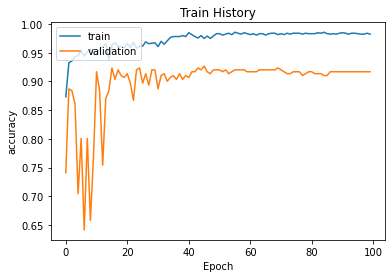

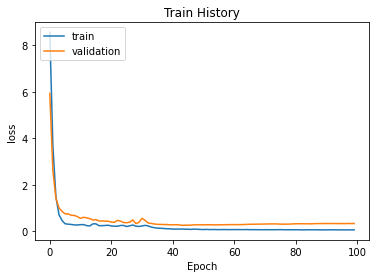

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_1.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 109us/step
check4: 1
** test loss: 0.33344096958983777
** test accuracy: 0.9169435501098633


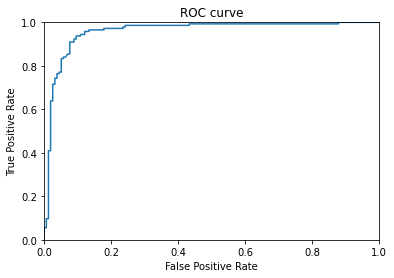


Acc : 0.917
Sen :  0.931
Spe :  0.904
AUC : 0.959
MCC : 0.834
f1-score : 0.915
Confusion_Matrix : 
 [[142  15]
 [ 10 134]] 


============================= CV 2 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 560
n: 640
##test:
p: 132
n: 169
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4806 - accuracy: 0.8833 - val_loss: 5.8575 - val_accuracy: 0.5482
Epoch 2/100
 - 0s - loss: 3.6054 - accuracy: 0.9367 - val_loss: 2.5962 - val_accuracy: 0.5548
Epoch 3/100
 - 0s - loss: 1.4472 - accuracy: 0.9333 - val_loss: 1.4215 - val_accuracy: 0.4684
Epoch 4/100
 - 0s - loss: 0.7456 - accuracy: 0.9400 - val_loss: 1.0568 - val_accuracy: 0.7309
Epoch 5/100
 - 0s - loss: 0.4591 - accuracy: 0.9542 - val_loss: 0.8895 - val_accuracy: 0.6312
Epoch 6/100
 - 0s - loss: 0.3548 - accuracy: 0.9483 - val_loss: 0.8126 - val_accuracy: 0.8538
Epoch 7/100
 - 0s - loss: 0.3199 - accuracy: 0.9525 - val_loss: 0.7756 - val_accuracy: 0.7907
Epoch 8/100
 - 0s - loss: 0.2923 - accuracy: 0.9492 - val_loss: 0.7165 - val_accuracy: 0.7807
Epoch 9/100
 - 0s - loss: 0.3087 - accuracy: 0.9508 - val_loss: 0.7394 - val_accuracy: 0.7076
Epoch 10/100
 - 0s - loss: 0.2701 - accuracy: 0.9558 - val_loss: 0.6518 - val_accuracy: 0.8638
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0672 - accuracy: 0.9817 - val_loss: 0.3256 - val_accuracy: 0.9302
Epoch 88/100
 - 0s - loss: 0.0665 - accuracy: 0.9850 - val_loss: 0.3237 - val_accuracy: 0.9302
Epoch 89/100
 - 0s - loss: 0.0665 - accuracy: 0.9792 - val_loss: 0.3221 - val_accuracy: 0.9269
Epoch 90/100
 - 0s - loss: 0.0667 - accuracy: 0.9783 - val_loss: 0.3195 - val_accuracy: 0.9269
Epoch 91/100
 - 0s - loss: 0.0666 - accuracy: 0.9808 - val_loss: 0.3252 - val_accuracy: 0.9236
Epoch 92/100
 - 0s - loss: 0.0645 - accuracy: 0.9808 - val_loss: 0.3221 - val_accuracy: 0.9269
Epoch 93/100
 - 0s - loss: 0.0648 - accuracy: 0.9825 - val_loss: 0.3249 - val_accuracy: 0.9302
Epoch 94/100
 - 0s - loss: 0.0693 - accuracy: 0.9808 - val_loss: 0.3291 - val_accuracy: 0.9302
Epoch 95/100
 - 0s - loss: 0.0649 - accuracy: 0.9808 - val_loss: 0.3282 - val_accuracy: 0.9302
Epoch 96/100
 - 0s - loss: 0.0638 - accuracy: 0.9800 - val_loss: 0.3257 - val_accuracy: 0.9302
Epoch 97/100
 - 0s - loss: 0.0625 - accuracy: 0.98

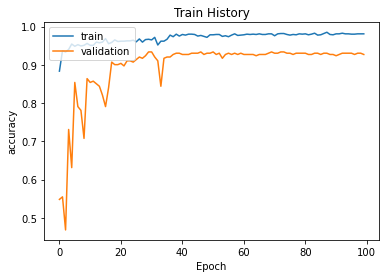

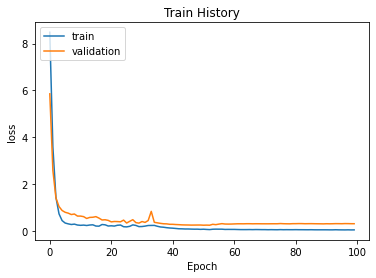

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_2.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 245us/step
check4: 2
** test loss: 0.325808092704247
** test accuracy: 0.9269102811813354


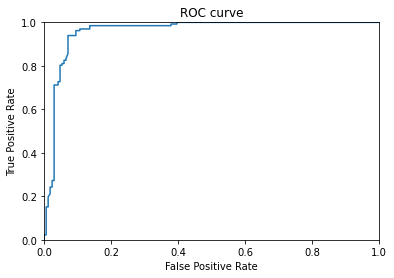


Acc : 0.927
Sen :  0.962
Spe :  0.899
AUC : 0.96
MCC : 0.856
f1-score : 0.92
Confusion_Matrix : 
 [[152  17]
 [  5 127]] 


============================= CV 3 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 556
n: 644
##test:
p: 136
n: 165
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 2s - loss: 8.5847 - accuracy: 0.8692 - val_loss: 5.9728 - val_accuracy: 0.6545
Epoch 2/100
 - 0s - loss: 3.7018 - accuracy: 0.9275 - val_loss: 2.6467 - val_accuracy: 0.8605
Epoch 3/100
 - 0s - loss: 1.4692 - accuracy: 0.9408 - val_loss: 1.4335 - val_accuracy: 0.8704
Epoch 4/100
 - 0s - loss: 0.7296 - accuracy: 0.9350 - val_loss: 1.0330 - val_accuracy: 0.9136
Epoch 5/100
 - 0s - loss: 0.4767 - accuracy: 0.9325 - val_loss: 0.8543 - val_accuracy: 0.9302
Epoch 6/100
 - 0s - loss: 0.3461 - accuracy: 0.9508 - val_loss: 0.7929 - val_accuracy: 0.8439
Epoch 7/100
 - 0s - loss: 0.3067 - accuracy: 0.9517 - val_loss: 0.7506 - val_accuracy: 0.7575
Epoch 8/100
 - 0s - loss: 0.2723 - accuracy: 0.9583 - val_loss: 0.6923 - val_accuracy: 0.7807
Epoch 9/100
 - 0s - loss: 0.2724 - accuracy: 0.9617 - val_loss: 0.6218 - val_accuracy: 0.8339
Epoch 10/100
 - 0s - loss: 0.2809 - accuracy: 0.9508 - val_loss: 0.6290 - val_accuracy: 0.6977
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0587 - accuracy: 0.9867 - val_loss: 0.3724 - val_accuracy: 0.9169
Epoch 88/100
 - 0s - loss: 0.0580 - accuracy: 0.9858 - val_loss: 0.3735 - val_accuracy: 0.9169
Epoch 89/100
 - 0s - loss: 0.0563 - accuracy: 0.9850 - val_loss: 0.3730 - val_accuracy: 0.9169
Epoch 90/100
 - 0s - loss: 0.0580 - accuracy: 0.9867 - val_loss: 0.3738 - val_accuracy: 0.9136
Epoch 91/100
 - 0s - loss: 0.0581 - accuracy: 0.9842 - val_loss: 0.3808 - val_accuracy: 0.9136
Epoch 92/100
 - 0s - loss: 0.0593 - accuracy: 0.9858 - val_loss: 0.3758 - val_accuracy: 0.9103
Epoch 93/100
 - 0s - loss: 0.0566 - accuracy: 0.9850 - val_loss: 0.3729 - val_accuracy: 0.9136
Epoch 94/100
 - 0s - loss: 0.0573 - accuracy: 0.9867 - val_loss: 0.3682 - val_accuracy: 0.9103
Epoch 95/100
 - 0s - loss: 0.0547 - accuracy: 0.9850 - val_loss: 0.3703 - val_accuracy: 0.9103
Epoch 96/100
 - 0s - loss: 0.0564 - accuracy: 0.9858 - val_loss: 0.3687 - val_accuracy: 0.9136
Epoch 97/100
 - 0s - loss: 0.0564 - accuracy: 0.98

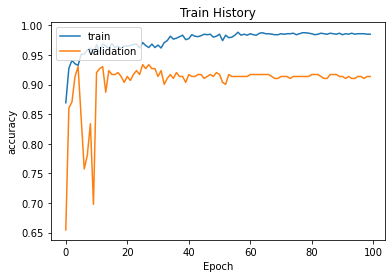

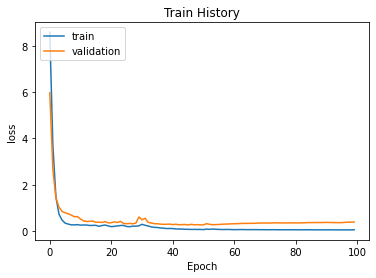

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_3.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 242us/step
check4: 3
** test loss: 0.3928114004507413
** test accuracy: 0.9136212468147278


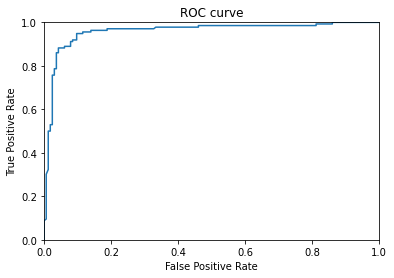


Acc : 0.914
Sen :  0.882
Spe :  0.939
AUC : 0.959
MCC : 0.826
f1-score : 0.902
Confusion_Matrix : 
 [[155  10]
 [ 16 120]] 

Wall time: 2min 3s


In [3]:
%%time

################# loading data ###################
protein = 'EGFR_family'
data_fp = pd.read_csv('data/EGFR_family_compounds.csv', header=None)

x_feature = data_fp.values[:, 2::]
y_label = data_fp.values[:, 0:2]
print("---------------------- Data information ----------------------")
print('EGFR_data:\n',data_fp.head(10))
print('x_feature:', x_feature.shape)
print('y_label:', y_label.shape)

################# performence index list #################
cv_acc = []
cv_sen = []
cv_spe = []
cv_auc = []
cv_mcc = []
cv_f1 = []

random_seed = 2
cv_n = 1

################### 10-CV random seed ###################
import random
random.seed(123)
random_seed = random.sample(range(1,1000),3)
print("\nrandom_seed:",len(random_seed),random_seed,'\n')

################ training model 10-CV ################
import figure_plot as fip
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix


cv_n = 1
for n in random_seed:
    print("\n============================= CV",str(cv_n),"=============================")

    ######################### split train and test data #########################
    train_x, test_x, train_smile_y, test_smile_y = train_test_split(x_feature, y_label, 
                                                                    train_size=0.8, test_size=0.2, 
                                                                    random_state=n)
    train_y = train_smile_y[:,1]
    test_y = test_smile_y[:,1]
    
    train_x = tf.keras.backend.cast_to_floatx(train_x)
    test_x = tf.keras.backend.cast_to_floatx(test_x)
    train_y = tf.keras.backend.cast_to_floatx(train_y)
    test_y = tf.keras.backend.cast_to_floatx(test_y)
    
    
    ################ data information ################
    print('all:', x_feature.shape)
    print('train_x:', train_x.shape)
    print('test_x:', test_x.shape)
    label_set = train_y.tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##train:")
    print('p:',label_count1)
    print('n:',label_count0)
    
    label_set = test_y.tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##test:")
    print('p:',label_count1)
    print('n:',label_count0)
    
    label_set = y_label[:,1].tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##all:")
    print('p:',label_count1)
    print('n:',label_count0)
    print('pos_rate:',round(label_count1/label_count0,3))
    
    ############## creat model #############
    
    print("\n--------------------- Taining history ---------------------")
    model = Sequential()  # 宣告keras model
    
    model.add(Dense(1024, input_dim=238, kernel_initializer='uniform')) 
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    #model.add(Dropout(0.2))
    
    model.add(Dense(768, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    
    model.add(Dense(512, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    
    model.add(Dense(256, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    model.add(Dense(units=1, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)
                   , activation='sigmoid'))
    
    Adam = optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
    
    model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy']) 
    
    #################### setting learning rate #####################
    lrate = ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.1, 
        patience=5, 
        verbose=0, 
        mode='auto', 
        epsilon=0.0001, 
        cooldown=0, 
        min_lr=0.00001 )
    
    #################### training model #####################
    train_history = model.fit(x = train_x,
                  y = train_y,
                  validation_data = (test_x,test_y),
                  epochs = 100,
                  batch_size = 64,
                  verbose = 2,
                  callbacks = [lrate])
    
    print("check2:",cv_n)
    fip.show_train_history(train_history,'accuracy','val_accuracy')
    fip.show_train_history(train_history,'loss','val_loss')
    
    ########################### Save model ###########################
    save_model = "save_model/" + protein + "_DNN_model_cv_"+ str(cv_n)+".hdf5"
    model.save(save_model)
    print("------------------------- Save model -------------------------")
    print("file:" + save_model,"\n")
    
    
    ########################### Evalutation model ###########################
    print("---------------------- Evalutation model ---------------------")
    test_loss, test_acc = model.evaluate(test_x, test_y)
    print("check4:",cv_n)
    
    print ("** test loss: {}".format(test_loss))
    print ("** test accuracy: {}".format(test_acc))
    
    pred_prob = model.predict(test_x)     ## model prediction
    pred_class = model.predict_classes(test_x)     
    pred_class_train = model.predict_classes(train_x)     
    y_test = test_y.astype(float)
    
    fpr, tpr, thresholds = roc_curve(y_test, pred_prob, pos_label=1) ## calcuate ROC
    fip.plot_roc_curve(fpr,tpr)
    
    print ("\nAcc : {}".format(round(test_acc,3)))
    
    cm1 = confusion_matrix(y_test,pred_class)
    sensitivity1 = cm1[1,1]/(cm1[1,0]+cm1[1,1])  ## calcuate sen
    print('Sen : ', round(sensitivity1, 3))
    
    specificity1 = cm1[0,0]/(cm1[0,0]+cm1[0,1])  ## calcuate spe
    print('Spe : ', round(specificity1,3))
    
    auc_score = roc_auc_score(y_test, pred_prob)  ## calcuate auc
    print('AUC :', round(auc_score,3))
    
    mcc_score = metrics.matthews_corrcoef(y_test, pred_class, sample_weight=None)  ## calcuate mcc
    print('MCC :', round(mcc_score,3))
    
    f1_score = metrics.f1_score(y_test, pred_class)  ## calcuate f1_score
    print('f1-score :', round(f1_score,3))
    
    print('Confusion_Matrix : \n', cm1,'\n')
    
    cv_acc.append(round(test_acc,3))
    cv_sen.append(round(sensitivity1, 3))
    cv_spe.append(round(specificity1,3))
    cv_auc.append(round(auc_score,3))
    cv_mcc.append(round(mcc_score,3))
    cv_f1.append(round(f1_score,3))
    
    cv_n += 1
    


In [4]:
print("** 10-CV Performence index: **")
print('Acc:', cv_acc,"\t|ave:",round(np.mean(cv_acc),3), round(np.std(cv_acc),3))
print('Sen:', cv_sen,"\t|ave:",round(np.mean(cv_sen),3), round(np.std(cv_sen),3))
print('Spe:', cv_spe,"\t|ave:",round(np.mean(cv_spe),3), round(np.std(cv_spe),3))
print('AUC:', cv_auc,"\t|ave:",round(np.mean(cv_auc),3), round(np.std(cv_auc),3))
print('MCC:', cv_mcc,"\t|ave:",round(np.mean(cv_mcc),3), round(np.std(cv_mcc),3))
print('f1-score:', cv_f1,"\t|ave:",round(np.mean(cv_f1),3), round(np.std(cv_f1),3))

best_cv = cv_auc.index(max(cv_auc))+1
model_name = protein + "_DNN_model_cv" + str(best_cv) +".hdf5"
print("\n** AUC best model : ",model_name)


** 10-CV Performence index: **
Acc: [0.917, 0.927, 0.914] 	|ave: 0.919 0.006
Sen: [0.931, 0.962, 0.882] 	|ave: 0.925 0.033
Spe: [0.904, 0.899, 0.939] 	|ave: 0.914 0.018
AUC: [0.959, 0.96, 0.959] 	|ave: 0.959 0.0
MCC: [0.834, 0.856, 0.826] 	|ave: 0.839 0.013
f1-score: [0.915, 0.92, 0.902] 	|ave: 0.912 0.008

** AUC best model :  EGFR_family_DNN_model_cv2.hdf5


## Loading the trained model

In [5]:
from keras.models import load_model

best_cv = cv_auc.index(max(cv_auc))+1
model_name = protein + "_DNN_model_cv_" + str(best_cv) +".hdf5"
model_load = "save_model/" + model_name
print("** loading model:",model_load)
model = load_model(model_load)

test_loss, test_acc = model.evaluate(test_x, test_y)
print ("**load model acc : {}".format(test_acc))


** loading model: save_model/EGFR_family_DNN_model_cv_2.hdf5
301/301 [==============================] - 0s 802us/step
**load model acc : 0.960132896900177


## Calcuate DeepSHAP
Calculate the Shaply contribution value for each featurea in the DNN model. Then we can know which compoufeature

In [6]:
import pandas as pd
import seaborn as sns
import keras
import shap

In [7]:
shap.initjs()

### Create an instance of the DeepSHAP which is called DeepExplainer
explainer_shap = shap.DeepExplainer(model=model,
                                 data=train_x)

### Fit the explainer on a subset of the data 
shap_values = explainer_shap.shap_values(X=train_x[::],
                                      ranked_outputs=True)

keras is no longer supported, please use tf.keras instead.


In [8]:
shap.force_plot(explainer_shap.expected_value, shap_values[0][0], train_x[::])

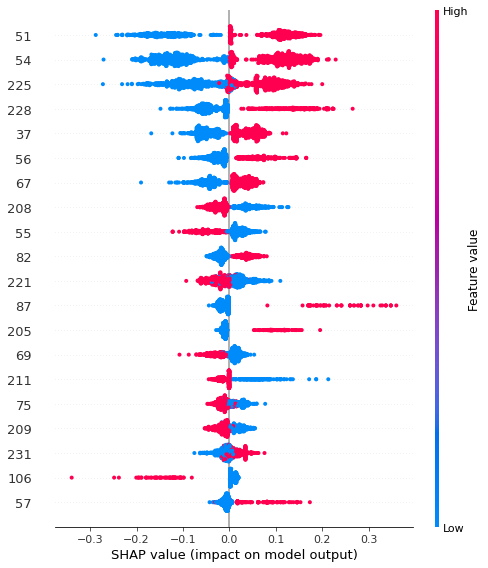

In [9]:
features = list(range(1,len(x_feature[0])+1))
### get the ovearall impact of each feature variable
shap.summary_plot(shap_values[0][0], train_x[::], feature_names=features)

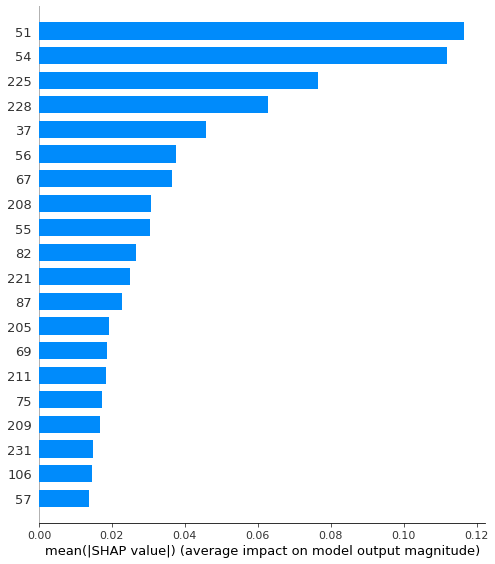

In [10]:
# Get the ovearall mean contribution of each feature variable
shap.summary_plot(shap_values[0][0], train_x[::], feature_names=features, plot_type="bar")
